# clip-02-05.jl

Load Julia packages (libraries) needed  for the snippets in chapter 0

In [1]:
using StatisticalRethinking, Optim
#gr(size=(600,600));

### snippet 3.2

In [2]:
p_grid = range(0, step=0.001, stop=1)
prior = ones(length(p_grid))
likelihood = [pdf(Binomial(9, p), 6) for p in p_grid]
posterior = likelihood .* prior
posterior = posterior / sum(posterior)
samples = sample(p_grid, Weights(posterior), length(p_grid));
samples[1:5]

5-element Array{Float64,1}:
 0.566
 0.535
 0.781
 0.568
 0.742

### snippet 3.3
Draw 10000 samples from this posterior distribution

In [3]:
N = 10000
samples = sample(p_grid, Weights(posterior), N);

In StatisticalRethinkingJulia samples will always be stored
in an MCMCChains.Chains object.

In [4]:
chn = MCMCChains.Chains(reshape(samples, N, 1, 1), ["toss"]);

Describe the chain

In [5]:
describe(chn)

2-element Array{ChainDataFrame,1}

Summary Statistics
. Omitted printing of 1 columns
│ Row │ parameters │ mean     │ std      │ naive_se   │ mcse       │ ess     │
│     │ Symbol     │ Float64  │ Float64  │ Float64    │ Float64    │ Any     │
├─────┼────────────┼──────────┼──────────┼────────────┼────────────┼─────────┤
│ 1   │ toss       │ 0.635501 │ 0.139656 │ 0.00139656 │ 0.00139297 │ 10000.0 │

Quantiles

│ Row │ parameters │ 2.5%     │ 25.0%   │ 50.0%   │ 75.0%   │ 97.5%    │
│     │ Symbol     │ Float64  │ Float64 │ Float64 │ Float64 │ Float64  │
├─────┼────────────┼──────────┼─────────┼─────────┼─────────┼──────────┤
│ 1   │ toss       │ 0.346975 │ 0.54    │ 0.644   │ 0.739   │ 0.880025 │


Plot the chain

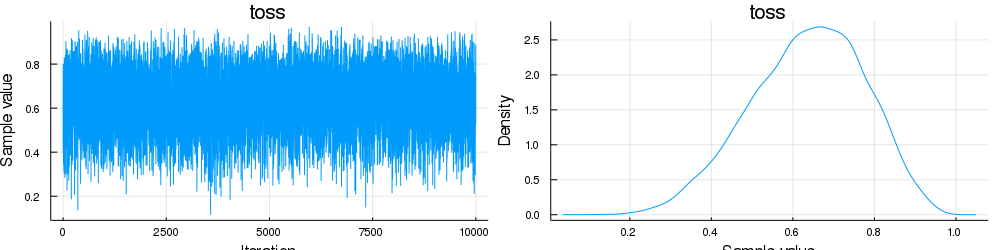

In [6]:
plot(chn)

### snippet 3.4

Create a vector to hold the plots so we can later combine them

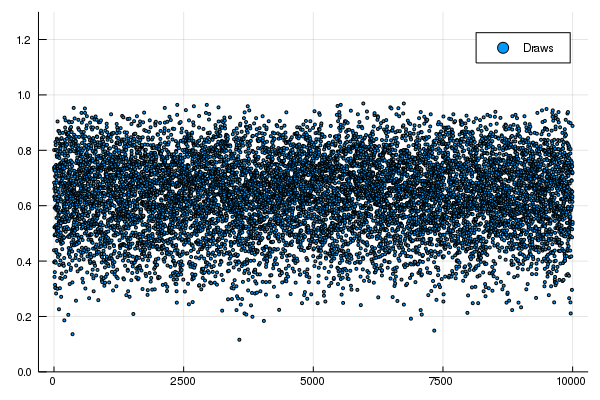

In [7]:
p = Vector{Plots.Plot{Plots.GRBackend}}(undef, 2)
p[1] = scatter(1:N, samples, markersize = 2, ylim=(0.0, 1.3), lab="Draws")

### snippet 3.5

Analytical calculation

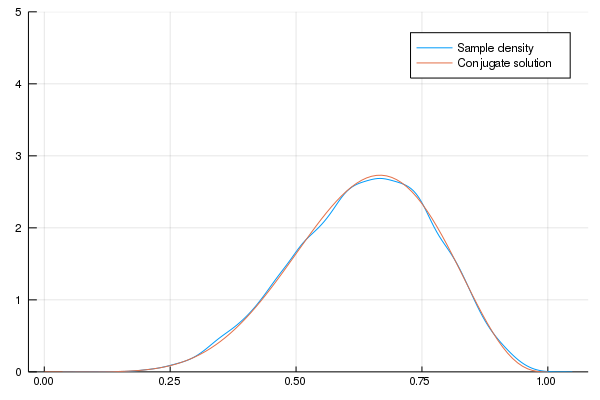

In [8]:
w = 6
n = 9
x = 0:0.01:1
p[2] = density(samples, ylim=(0.0, 5.0), lab="Sample density")
p[2] = plot!( x, pdf.(Beta( w+1 , n-w+1 ) , x ), lab="Conjugate solution")

Add quadratic approximation

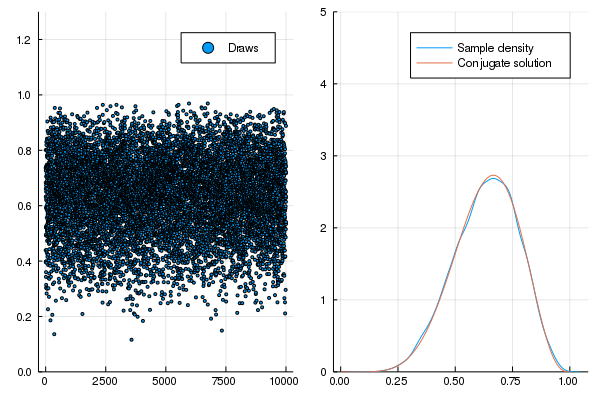

In [9]:
plot(p..., layout=(1, 2))

End of `03/clip-02-05.jl`

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*